## Analysis of 3D positionning with monocular Humans in 4D (3D keypoints) and triangulation with Pose2Sim (HUmans in 4D - 2D keypoints)

By: Léa Drolet-Roy

Last modification: 2025-07-24

Full pipeline in compare_keypoints_3D.py

In [37]:
import os
import cv2
import numpy as np
import pandas as pd
import re
import joblib

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from scipy.spatial.transform import Rotation as rot

In [38]:
# --- Load and parse .trc file ---
def load_trc(filename):
    with open(filename, 'r') as f:
        lines = f.readlines()

    # --- Metadata ---
    data_start_line = 5
    header_line = lines[3]
    header_parts = re.split(r'\s+', header_line.strip())
    
    marker_names = header_parts[2:]  # skip "Frame#" and "Time"
    n_markers = len(marker_names)
    
    # Reconstruct columns: Frame#, Time, then X/Y/Z for each marker
    cols = ['Frame#', 'Time']
    for name in marker_names:
        cols.append(f'{name}_X')
        cols.append(f'{name}_Y')
        cols.append(f'{name}_Z')

    # Read numerical data starting from line 6
    df = pd.read_csv(filename, sep=r'\s+|\t+', engine='python', skiprows=data_start_line, header=None)
    df.columns = cols

    return df, marker_names

def extract_trc_positions(df, marker_names):
    return np.stack([
        df[[f"{name}_X", f"{name}_Y", f"{name}_Z"]].values
        for name in marker_names
    ], axis=1)  # shape: (n_frames, n_markers, 3)

def get_trc_frames(df, marker_names):
    # List of all X/Y/Z coordinate columns
    coord_cols = [f"{name}_{axis}" for name in marker_names for axis in ['X', 'Y', 'Z']]

    # Boolean mask: True if at least one coordinate in the row is not NaN
    detection_mask = df[coord_cols].notna().any(axis=1)

    # Extract corresponding frame numbers
    detected_frames = df.loc[detection_mask, 'Frame#'].astype(int).tolist()

    return detected_frames

def project(joints_3d, cam_trans, size):
    f = 5000

    K = np.array([[f/256, 0, 0],
                [0, f/256, 0],
                [0, 0, 1]])
    R = np.eye(3)

    points = joints_3d + cam_trans # (4,3)

    proj = (K @ R @ points.T).T # (4,3)
    proj_norm = proj[:,:2] / proj[:,2].reshape(-1,1)
    proj_im = proj_norm * max(size) * scale
    proj_im += np.array(size[::-1])/2
    return proj_im

def load_3d_keypoints(filename, transfo=True):
    results = joblib.load(filename)
    all_joints = []

    for frame_idx in sorted(results, key=lambda x: x[-9:]):
        frame_res = results[frame_idx]

        # If there's only one person
        if len(frame_res['3d_joints']) > 0:
            joints_3d = frame_res['3d_joints']  # shape (N, 3)
            
            if transfo:
                transformed_joints = []
                # Apply transformations
                for i in range(len(joints_3d)):
                    cam_trans = frame_res['pose'][i][-3:].reshape((1,3))
                    orient = frame_res['smpl'][i]['global_orient']
                    scale = frame_res['scale'][i]

                    T_cam = np.eye(4)
                    T_cam[0:3, 0:3] = orient
                    T_cam[0:3, 3] = cam_trans

                    pts_3d = joints_3d[i] #* scale
                    
                    pts_trans_rot = np.linalg.inv(T_cam) @ np.vstack((pts_3d.T, np.ones((1, 45))))
                    pts_trans_rot = pts_trans_rot.T[:,0:3]
                    transformed_joints.append(pts_trans_rot)

                all_joints.append(transformed_joints) # shape (d, N, 3)
            else:
                all_joints.append(joints_3d)
        else:
            all_joints.append([np.full((45,3), np.nan)])  # or zero if missing

    num_frames = len(all_joints)
    max_persons = max(len(frame_list) for frame_list in all_joints)
    num_joints = all_joints[0][0].shape[0]  # Assuming all persons have same joints count

    for t in range(num_frames):
        persons_in_frame = len(all_joints[t])
        if persons_in_frame < max_persons:
            # create padding arrays full of nan
            pad_count = max_persons - persons_in_frame
            nan_pad = [np.full((num_joints, 3), np.nan)] * pad_count
            all_joints[t].extend(nan_pad)

    # Now convert to np.array
    all_joints_array = np.array(all_joints)

    return all_joints_array  # shape (n_frames, n_joints, 3)

def procrustes_align(A_pts, B_pts):
    """
    Computes optimal rotation, translation, and scale to align B_pts to A_pts.
    Returns: B_aligned (N, 3), R (3,3), scale (float), t (1,3)
    """
    A_mean = A_pts.mean(axis=0)
    B_mean = B_pts.mean(axis=0)

    A_c = A_pts - A_mean
    B_c = B_pts - B_mean

    norm_A = np.linalg.norm(A_c)
    norm_B = np.linalg.norm(B_c)

    A_c /= norm_A
    B_c /= norm_B

    H = B_c.T @ A_c
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T

    if np.linalg.det(R) < 0:
        Vt[-1, :] *= -1
        R = Vt.T @ U.T

    scale = (S.sum()) * (norm_A / norm_B)
    t = A_mean - (B_mean @ R) * scale

    return R, scale, t

def kabsch_align(A_pts, B_pts):
    """
    Computes optimal rotation and translation to align B_pts to A_pts (no scaling).
    Returns: R (3,3), t (1,3)
    """
    A_mean = A_pts.mean(axis=0)
    B_mean = B_pts.mean(axis=0)

    A_c = A_pts - A_mean
    B_c = B_pts - B_mean

    H = B_c.T @ A_c
    U, _, Vt = np.linalg.svd(H)

    # Validate right-handed coordinate system
    if np.linalg.det(np.dot(Vt.T, U.T)) < 0.0:
        Vt[-1, :] *= -1.0

    # Optimal rotation
    R = np.dot(Vt.T, U.T)

    t = A_mean - (B_mean @ R)

    return R, t

def draw_skeleton(points_2d, color, ax, label=None):
    skeleton = [
        (1, 8),    # Neck -> Mid Hip
        (1, 5),    # Neck -> R Shoulder
        (5, 6),    # R Shoulder -> R Elbow
        (6, 7),    # R Elbow -> R Wrist
        (1, 2),    # Neck -> L Shoulder
        (2, 3),    # L Shoulder -> L Elbow
        (3, 4),    # L Elbow -> L Wrist
        (8, 12),    # Mid Hip -> R Hip
        (12, 13),   # R Hip -> R Knee
        (13, 14),  # R Knee -> R Ankle
        (8, 9),   # Mid Hip -> L Hip
        (9, 10),  # L Hip -> L Knee
        (10, 11),  # L Knee -> L Ankle
        (0, 1),    # Neck -> Nose
        ]
    
    for i, j in skeleton:
        xline = [points_2d[i][0], points_2d[j][0]]
        yline = [points_2d[i][1], points_2d[j][1]]
        if points_2d[i].shape[-1] == 3:
            zline = [points_2d[i][2], points_2d[j][2]]
            ax.plot(xline, yline, zline, color=color)
        else:
            ax.plot(xline, yline, color=color)
    return

In [39]:
routine = '1_partie_0429_000'
i = 1

cameras = ['Camera1_M11139', 'Camera2_M11140', 'Camera3_M11141', 'Camera4_M11458', 'Camera5_M11459', 'Camera6_M11461', 'Camera7_M11462', 'Camera8_M11463']
camera = cameras[i]

trc_path = f"/home/lea/trampo/Pose2Sim/pose-3d-4DHumans/{routine}.trc"
pkl_path = f"/home/lea/trampo/4DHumans/outputs/results/demo_{routine}-{camera}.pkl"

In [40]:
trc_data, marker_names = load_trc(trc_path)
trc_positions = extract_trc_positions(trc_data, marker_names)
frames = get_trc_frames(trc_data, marker_names)

pkl_positions = load_3d_keypoints(pkl_path)

A = trc_positions
B = pkl_positions[frames]

print(A.shape, B.shape)

(1300, 21, 3) (1300, 2, 45, 3)


### Find matching joints and reorder skeletons

In [41]:
pose2sim = ['Hip', 'RHip', 'RKnee', 'RAnkle', 'RBigToe', 'RSmallToe', 'RHeel', 'LHip', 'LKnee', 'LAnkle', 'LBigToe', 'LSmallToe', 'LHeel',
            'Neck', 'Nose', 'RShoulder', 'RElbow', 'RWrist', 'LShoulder', 'LElbow', 'LWrist']
humans = ['Nose', 'Neck', 'RShoulder', 'RElbow', 'RWrist', 'LShoulder', 'LElbow', 'LWrist',
          'Hip', 'RHip', 'RKnee', 'RAnkle', 'LHip', 'LKnee', 'LAnkle', 'REye', 'LEye', 'Rear', 'LEar']

common_indices = [j for j in humans if j in pose2sim]

# Get the index order to match Pose2Sim's triangulated keypoints
matching_pose2sim = [pose2sim.index(j) for j in common_indices]
matching_humans = [humans.index(j) for j in common_indices]

A = A[:, matching_pose2sim]
B = B[:, :, matching_humans]


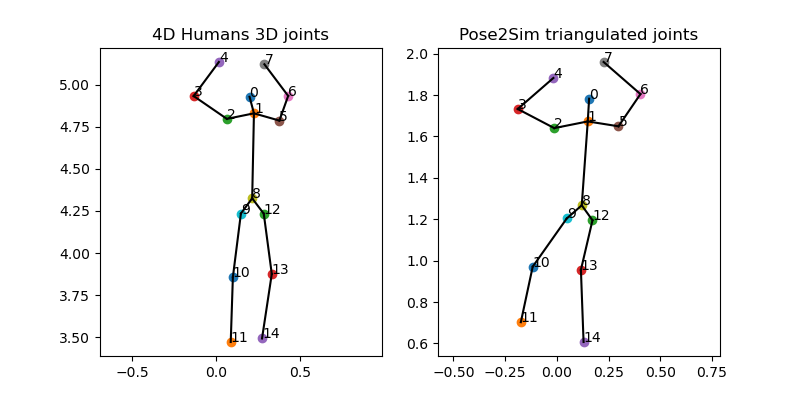

In [42]:
plt.close()
frame_idx = 330

fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(121)

if not np.isnan(B[frame_idx, 1]).any():
    B_athlete = B[frame_idx, 1]
else:
    B_athlete = B[frame_idx, 0]
for i, pt in enumerate(B_athlete):
    ax.scatter(pt[0], pt[1])
    ax.text(pt[0], pt[1], i)

draw_skeleton(B_athlete[:, :2], 'black', ax)
ax.axis('equal')
ax.set_title('4D Humans 3D joints')

ax = fig.add_subplot(122)
for i, pt in enumerate(A[frame_idx]):
    ax.scatter(pt[0], pt[1])
    ax.text(pt[0], pt[1], i)

draw_skeleton(A[frame_idx, :, :2], 'black', ax)
ax.axis('equal')
ax.set_title('Pose2Sim triangulated joints')

plt.show()


### Transform to align skeletons

In [43]:
F, K_A, _ = A.shape        # (F, 13, 3)
num_dets, K_B = B.shape[1], B.shape[2]  # (F, 2, 45, 3)

assert K_A == K_B

def compute_error(A, B, K_A, K_B):
    """ cost_matrix = np.zeros((K_A, K_B))
    for i in range(K_A):
        for j in range(K_B):
            cost_matrix[i, j] = np.linalg.norm(A[i] - B[j])

    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    B_selected = B[col_ind]  # (13, 3) """

    error = np.nanmean(np.linalg.norm(A - B, axis=1))

    return error, B

mpjpe_raw_all, mpjpe_pa_all, mpjpe_ka_all = [], [], []
B_selected_all, B_selected_PA_all, B_selected_KA_all = [], [], []
frame_indices = []
PA_transfo, KA_transfo = [], []

for t in range(F):
    A_frame = A[t]            # (13, 3)
    B_frame = B[t]            # (2, 45, 3)

    errors, PA_errors, KA_errors = [], [], []
    B_selected_list, B_selected_PA_list, B_selected_KA_list = [], [], []

    for person_idx in range(num_dets):
        B_person = B_frame[person_idx]  # (45, 3)

        if np.isnan(B_person).any() or np.isnan(A_frame).any():
            continue

        # Step 1: Compute assignment cost *before* alignment
        error, B_selected = compute_error(A_frame, B_person, K_A, K_B)
        errors.append(error)
        B_selected_list.append(B_selected)

        # Step 2.1: Align matching B keypoints (45 -> 13 joints) to A_frame (13 joints) with Procrustes
        R, scale, t_vec = procrustes_align(A_frame, B_person[:15])  # or use Kabsch
        B_person_PA = (B_person @ R) * scale + t_vec  # shape: (45, 3)
        PA_transfo.append((R, scale, t_vec))

        # Step 2.2: Align with Kabsch
        R, t_vec = kabsch_align(A_frame, B_person[:15])
        B_person_KA = (B_person @ R) + t_vec
        KA_transfo.append((R, t_vec))

        # Step 3: Compute assignment cost *after* alignment
        PA_error, B_selected_PA = compute_error(A_frame, B_person_PA, K_A, K_B)
        PA_errors.append(PA_error)
        B_selected_PA_list.append(B_selected_PA)

        KA_error, B_selected_KA = compute_error(A_frame, B_person_KA, K_A, K_B)
        KA_errors.append(KA_error)
        B_selected_KA_list.append(B_selected_KA)

    if len(errors) > 0: # at least 1 detection in frame
        # Step 4: Find detection with lowest error *before* alignment
        best_idx = np.argmin(errors)
        best_B_selected = B_selected_list[best_idx]

        # Step 5: Find detection with lowest error *after* alignment
        best_idx_PA = np.argmin(PA_errors)
        best_B_selected_PA = B_selected_PA_list[best_idx_PA]

        best_idx_KA = np.argmin(KA_errors)
        best_B_selected_KA = B_selected_KA_list[best_idx_KA]

        B_selected_all.append(best_B_selected)                # (13, 3)
        B_selected_PA_all.append(best_B_selected_PA)          # (13, 3)
        B_selected_KA_all.append(best_B_selected_KA)          # (13, 3)
        frame_indices.append(int(t))
        
        # Step 6: Compute mean errors
        mpjpe_raw = np.nanmean(np.linalg.norm(A_frame - best_B_selected, axis=1))
        mpjpe_pa = np.nanmean(np.linalg.norm(A_frame - best_B_selected_PA, axis=1))
        mpjpe_ka = np.nanmean(np.linalg.norm(A_frame - best_B_selected_KA, axis=1))

        mpjpe_raw_all.append(mpjpe_raw)
        mpjpe_pa_all.append(mpjpe_pa)
        mpjpe_ka_all.append(mpjpe_ka)

B_selected_all = np.array(B_selected_all)             # shape (F_valid, 13, 3)
B_selected_PA_all = np.array(B_selected_PA_all)
B_selected_KA_all = np.array(B_selected_KA_all)

A_valid = A[frame_indices]  # truncate A if needed (to match valid frames)

# === Global Alignment ===
R_global, t_global = kabsch_align(A_valid.reshape(-1, 3), B_selected_all.reshape(-1, 3))

print('Global rotation (x,y,z degrees):', rot.from_matrix(R_global).as_euler('xyz', degrees=True))  # shape (F, 3))
print('Global translation (m):', t_global)

B_selected_global_all = (B_selected_all @ R_global) + t_global  # (F_valid, 13, 3)
mpjpe_global_all = np.mean(np.linalg.norm(A_valid - B_selected_global_all, axis=2), axis=1)

# Print results
print(f'Average MPJPE raw: {np.mean(mpjpe_raw_all):.3f} m')
print(f'Min MPJPE raw: {np.min(mpjpe_raw_all):.3f} m')
print(f'Max MPJPE raw: {np.max(mpjpe_raw_all):.3f} m')

print(f'Average Global KA-MPJPE: {np.mean(mpjpe_global_all):.3f} m')
print(f'Min Global KA-MPJPE: {np.min(mpjpe_global_all):.3f} m')
print(f'Max Global KA-MPJPE: {np.max(mpjpe_global_all):.3f} m')

""" print(f'Average PA-MPJPE:  {np.mean(mpjpe_pa_all):.3f} m')
print(f'Min PA-MPJPE:  {np.min(mpjpe_pa_all):.3f} m')
print(f'Max PA-MPJPE:  {np.max(mpjpe_pa_all):.3f} m') """

print(f'Average KA-MPJPE:  {np.mean(mpjpe_ka_all):.3f} m')
print(f'Min KA-MPJPE:  {np.min(mpjpe_ka_all):.3f} m')
print(f'Max KA-MPJPE:  {np.max(mpjpe_ka_all):.3f} m')


Global rotation (x,y,z degrees): [ 33.52 -23.51 174.55]
Global translation (m): [-0.13  4.95 -0.8 ]
Average MPJPE raw: 3.297 m
Min MPJPE raw: 0.470 m
Max MPJPE raw: 5.612 m
Average Global KA-MPJPE: 2.086 m
Min Global KA-MPJPE: 0.722 m
Max Global KA-MPJPE: 4.124 m
Average KA-MPJPE:  0.322 m
Min KA-MPJPE:  0.044 m
Max KA-MPJPE:  0.846 m


### Visualize transformations distributions

In [44]:
np.set_printoptions(precision=2, suppress=True)

R_all, scale_all, t_all = [], [], []

""" for R, scale, t in PA_transfo:
    R_all.append(R)
    scale_all.append(scale)
    t_all.append(t)

R_all = np.array(R_all)
scale_all = np.array(scale_all)
t_all = np.array(t_all) """

for R, t in KA_transfo:
    R_all.append(R)
    t_all.append(t)

R_all = np.array(R_all)
t_all = np.array(t_all)

euler_all = rot.from_matrix(R_all).as_euler('xyz', degrees=True)  # shape (F, 3)
mean_rot = np.mean(euler_all, axis=0)
median_rot = np.median(euler_all, axis=0)
print(camera)
print('Mean transformations')
print('Rot:', mean_rot)
print('Trans:', np.mean(t_all, axis=0))

print('\nMedian transformations')
print('Rot:', median_rot)
print('Trans:', np.median(t_all, axis=0))

R_all_reconstructed = rot.from_euler('xyz', mean_rot, degrees=True).as_matrix()
#print(R_all_reconstructed)

print('\nGlobal transformations')
print('Rot:', rot.from_matrix(R_global).as_euler('xyz', degrees=True))
print('Trans:', t_global)


Camera2_M11140
Mean transformations
Rot: [ -2.97   6.12 -18.46]
Trans: [-0.14  2.54  0.52]

Median transformations
Rot: [-11.01   3.82 -14.99]
Trans: [-0.3   3.29  0.39]

Global transformations
Rot: [ 33.52 -23.51 174.55]
Trans: [-0.13  4.95 -0.8 ]


In [45]:
""" plt.figure(figsize=(6, 4))
plt.hist(scale_all, bins=30, color='skyblue', edgecolor='k')
plt.xlabel('Scale')
plt.ylabel('Count')
plt.title('Distribution of Scale Factors')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 3))
plt.plot(scale_all, label='scale')
plt.xlabel('Frame')
plt.ylabel('Scale')
plt.title('Scale over Time')
plt.grid(True)
plt.tight_layout()
plt.show() """


" plt.figure(figsize=(6, 4))\nplt.hist(scale_all, bins=30, color='skyblue', edgecolor='k')\nplt.xlabel('Scale')\nplt.ylabel('Count')\nplt.title('Distribution of Scale Factors')\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\nplt.figure(figsize=(6, 3))\nplt.plot(scale_all, label='scale')\nplt.xlabel('Frame')\nplt.ylabel('Scale')\nplt.title('Scale over Time')\nplt.grid(True)\nplt.tight_layout()\nplt.show() "

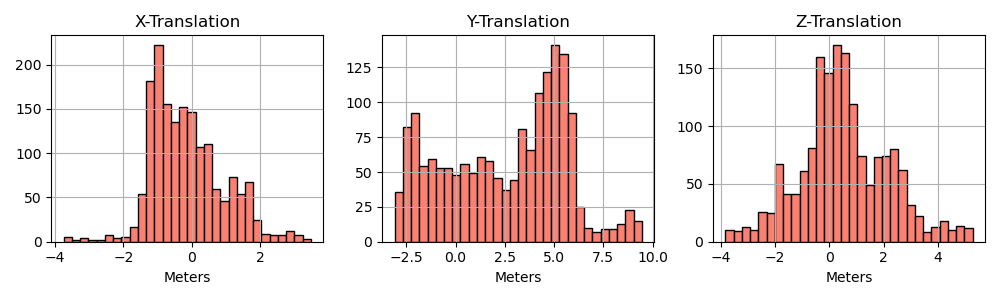

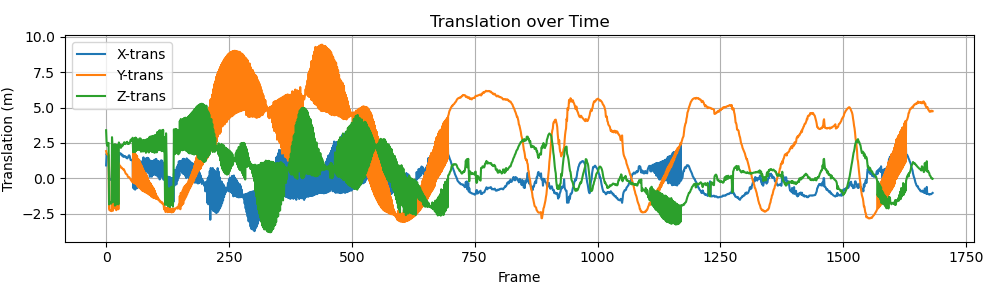

In [46]:
plt.figure(figsize=(10, 3))
for i, axis in enumerate(['X', 'Y', 'Z']):
    plt.subplot(1, 3, i+1)
    plt.hist(t_all[:, i], bins=30, color='salmon', edgecolor='k')
    plt.title(f'{axis}-Translation')
    plt.xlabel('Meters')
    plt.grid(True)
plt.tight_layout()
# plt.savefig(f'3DregistrationFigs/Translation_hist_{routine}_{camera}.png')
plt.show()

plt.figure(figsize=(10, 3))
for i, axis in enumerate(['X', 'Y', 'Z']):
    plt.plot(t_all[:, i], label=f'{axis}-trans')
plt.legend()
plt.xlabel('Frame')
plt.ylabel('Translation (m)')
plt.title('Translation over Time')
plt.grid(True)
plt.tight_layout()
# plt.savefig(f'3DregistrationFigs/Translation_time_{routine}_{camera}.png')
plt.show()


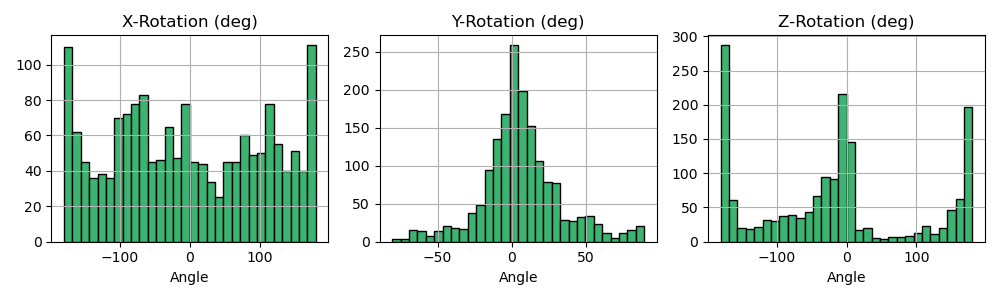

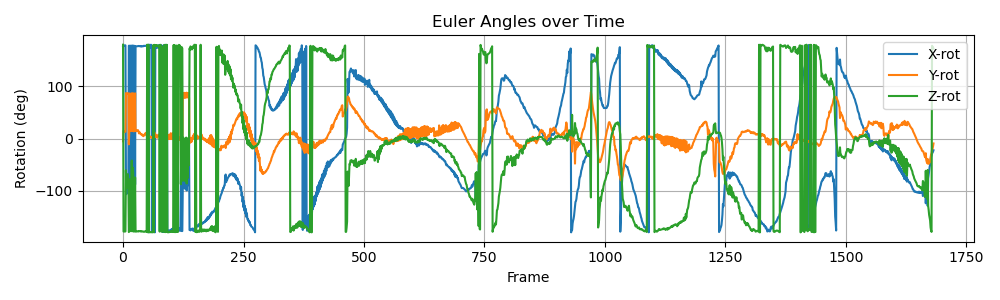

In [47]:
plt.figure(figsize=(10, 3))
for i, axis in enumerate(['X', 'Y', 'Z']):
    plt.subplot(1, 3, i+1)
    plt.hist(euler_all[:, i], bins=30, color='mediumseagreen', edgecolor='k')
    plt.title(f'{axis}-Rotation (deg)')
    plt.xlabel('Angle')
    plt.grid(True)
plt.tight_layout()
# plt.savefig(f'3DregistrationFigs/Rotation_hist_{routine}_{camera}.png')
plt.show()

plt.figure(figsize=(10, 3))
for i, axis in enumerate(['X', 'Y', 'Z']):
    plt.plot(euler_all[:, i], label=f'{axis}-rot')
plt.legend()
plt.xlabel('Frame')
plt.ylabel('Rotation (deg)')
plt.title('Euler Angles over Time')
plt.grid(True)
plt.tight_layout()
# plt.savefig(f'3DregistrationFigs/Rotation_time_{routine}_{camera}.png')
plt.show()


### Visualize MPJPE distribution

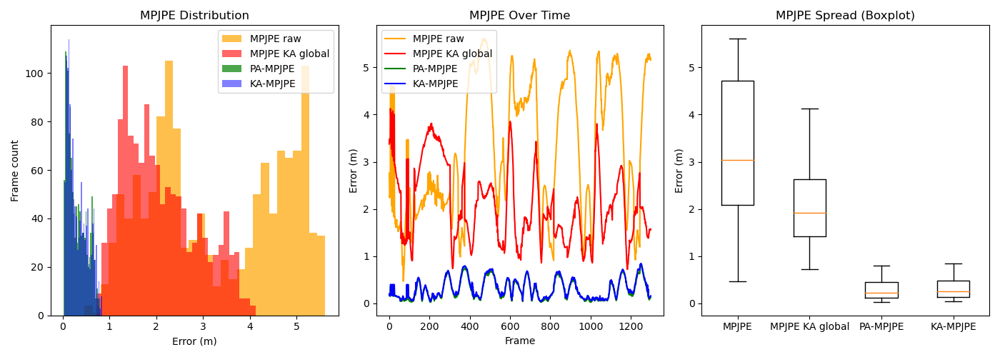

In [48]:
import matplotlib.pyplot as plt

frames = np.arange(len(mpjpe_raw_all))

plt.figure(figsize=(14, 5))

# --- MPJPE raw histogram ---
plt.subplot(1, 3, 1)
plt.hist(mpjpe_raw_all, bins=30, alpha=0.7, label='MPJPE raw', color='orange')
plt.hist(mpjpe_global_all, bins=30, alpha=0.6, label='MPJPE KA global', color='red')
plt.hist(mpjpe_pa_all, bins=30, alpha=0.7, label='PA-MPJPE', color='green')
plt.hist(mpjpe_ka_all, bins=30, alpha=0.5, label='KA-MPJPE', color='blue')
plt.xlabel('Error (m)')
plt.ylabel('Frame count')
plt.title('MPJPE Distribution')
plt.legend()

# --- MPJPE over time ---
plt.subplot(1, 3, 2)
plt.plot(frames, mpjpe_raw_all, label='MPJPE raw', color='orange')
plt.plot(frames, mpjpe_global_all, label='MPJPE KA global', color='red')
plt.plot(frames, mpjpe_pa_all, label='PA-MPJPE', color='green')
plt.plot(frames, mpjpe_ka_all, label='KA-MPJPE', color='blue')
plt.xlabel('Frame')
plt.ylabel('Error (m)')
plt.title('MPJPE Over Time')
plt.legend()

# --- Boxplot ---
plt.subplot(1, 3, 3)
plt.boxplot([mpjpe_raw_all, mpjpe_global_all, mpjpe_pa_all, mpjpe_ka_all], labels=['MPJPE', 'MPJPE KA global', 'PA-MPJPE', 'KA-MPJPE'])
plt.ylabel('Error (m)')
plt.title('MPJPE Spread (Boxplot)')

plt.tight_layout()
# plt.savefig(f'3DregistrationFigs/MPJPE_{routine}_{camera}.png')
plt.show()


### Visualize joints alignment across time

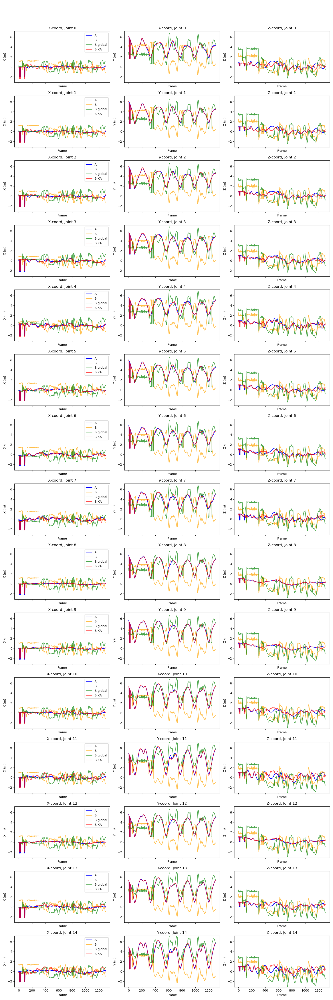

In [49]:
def plot_joint_coordinates_over_time(A, B, C, D, joint_names=None, title_prefix=''):
    """
    A: (F, 13, 3) - ground truth joints over frames
    B_selected: (F, 13, 3) - matched joints from B
    joint_names: list of joint names (optional)
    """

    F, K, _ = A.shape
    t = np.arange(F)

    # Compute global y-limits per axis (X, Y, Z)
    y_mins = [np.min([A[:, :, i], B[:, :, i], C[:, :, i], D[:, :, i]]) for i in range(3)]
    y_maxs = [np.max([A[:, :, i], B[:, :, i], C[:, :, i], D[:, :, i]]) for i in range(3)]

    # Compute global y-limits (all X, Y, Z)
    all_data = np.concatenate([
        A.reshape(-1),
        B.reshape(-1),
        C.reshape(-1),
        D.reshape(-1)
    ])
    y_min, y_max = all_data.min(), all_data.max()


    # Set up grid: K rows (joints), 3 columns (X, Y, Z)
    fig, axes = plt.subplots(K, 3, figsize=(15, 3 * K), sharex=True)
    if K == 1:
        axes = axes[np.newaxis, :]  # Ensure 2D even when K == 1

    for j in range(K):
        for i, axis in enumerate(['X', 'Y', 'Z']):
            ax = axes[j, i]
            ax.plot(t, A[:, j, i], label='A', color='blue')
            ax.plot(t, B[:, j, i], label='B', color='orange', alpha=0.7)
            ax.plot(t, C[:, j, i], label='B global', color='green', alpha=0.7)
            ax.plot(t, D[:, j, i], label='B KA', color='red', alpha=0.7)
            ax.set_xlabel('Frame')
            ax.set_ylabel(f'{axis} (m)')
            title = f'{axis}-coord, Joint {j}'
            if joint_names:
                title += f" ({joint_names[j]})"
            ax.set_title(title)

            # Set common y-limits per axis column
            #ax.set_ylim(y_mins[i], y_maxs[i])
            ax.set_ylim(y_min, y_max)

            if i == 0:
                ax.legend(loc='upper right')

    fig.suptitle(title_prefix.strip(), fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    # plt.savefig(f'3DregistrationFigs/Joints_{routine}_{camera}.png')
    plt.show()


plot_joint_coordinates_over_time(A_valid, B_selected_all, B_selected_global_all, B_selected_KA_all)


### Show all frames

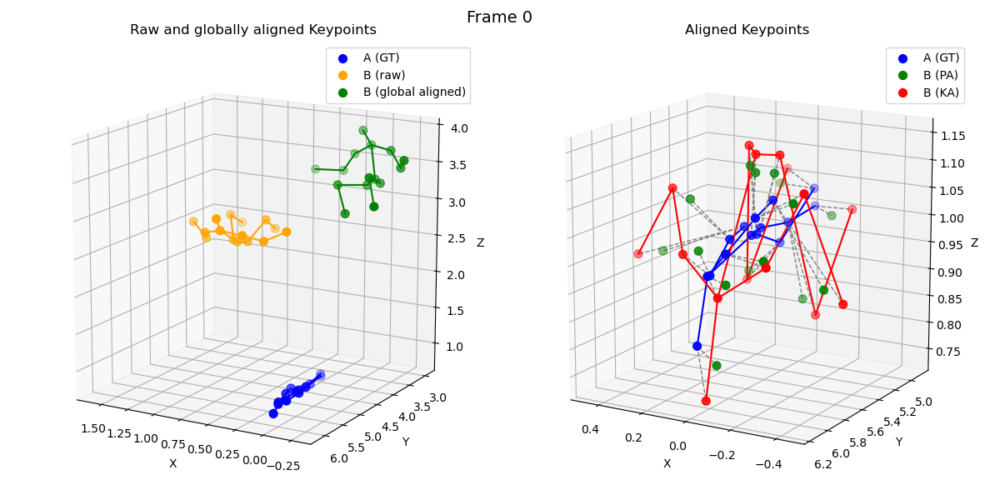

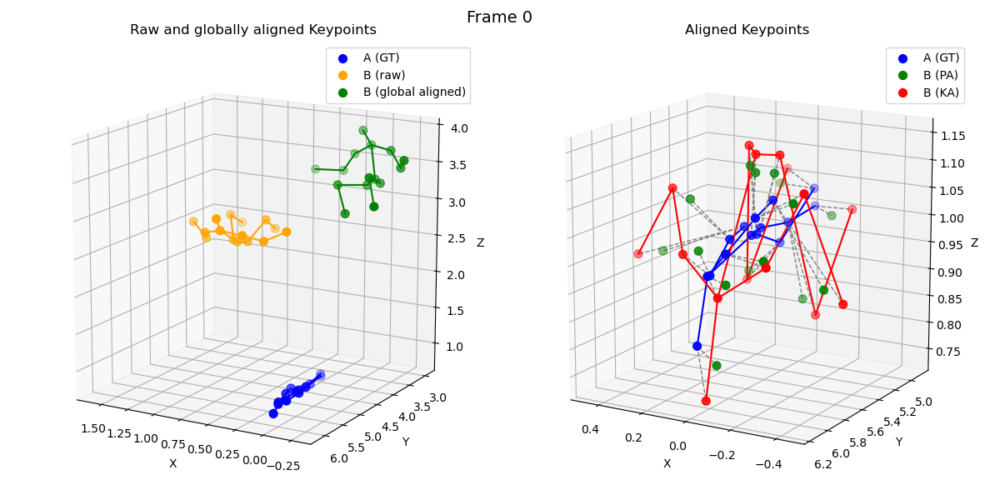

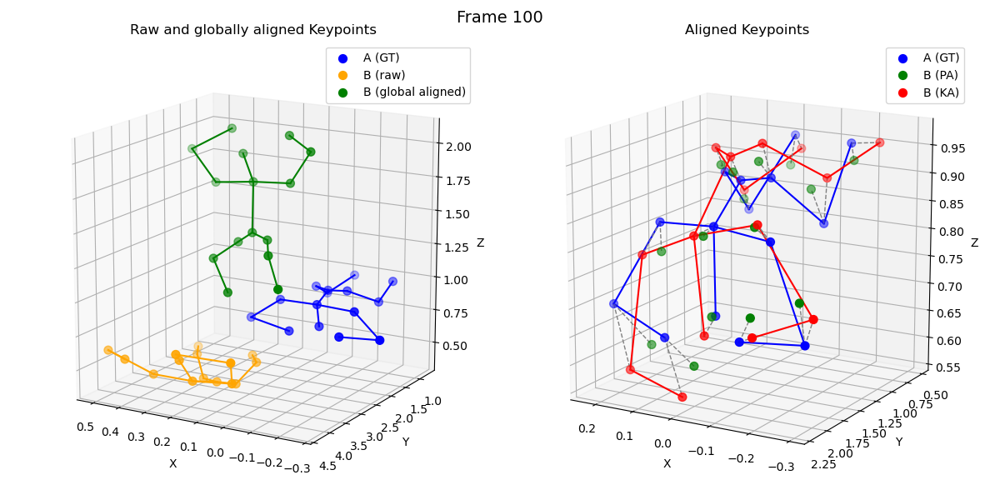

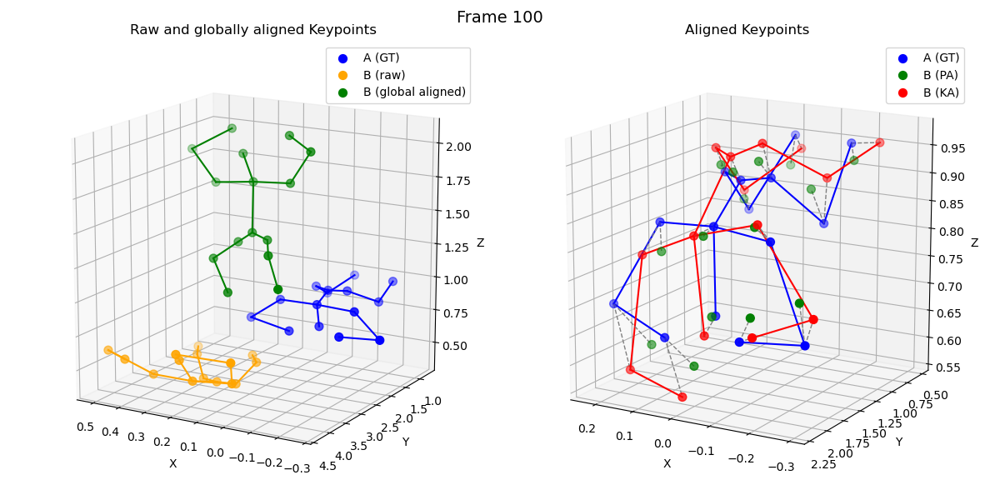

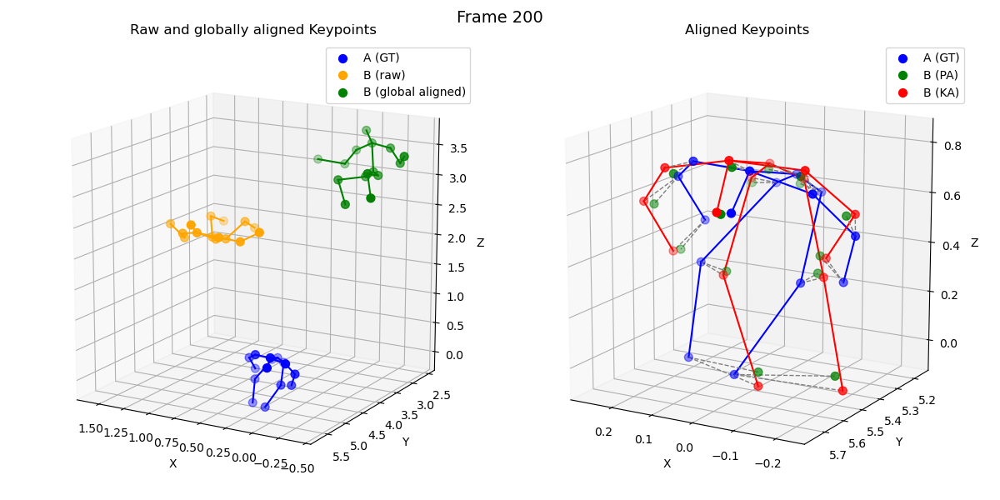

...

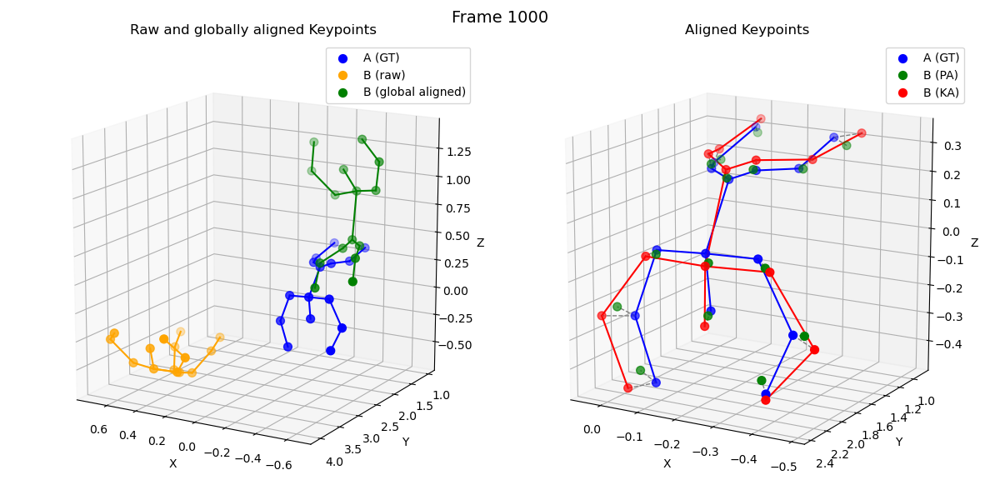

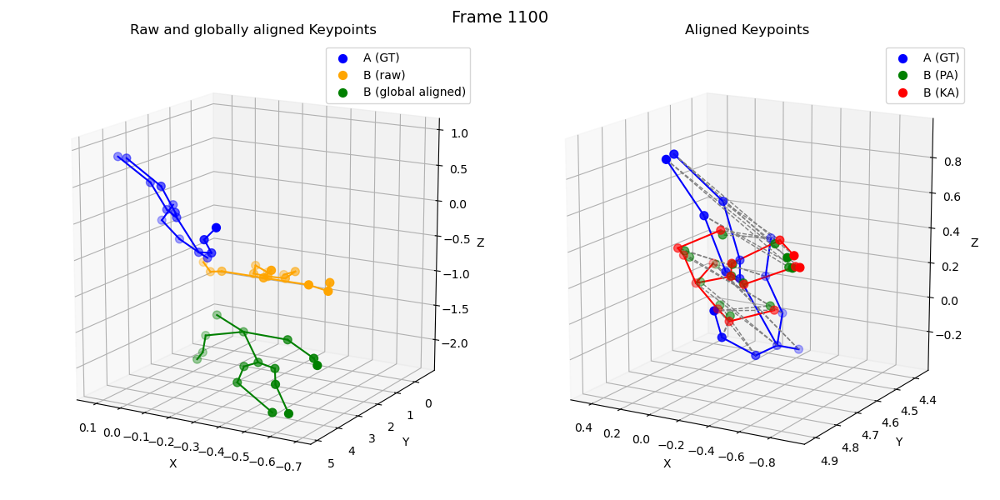

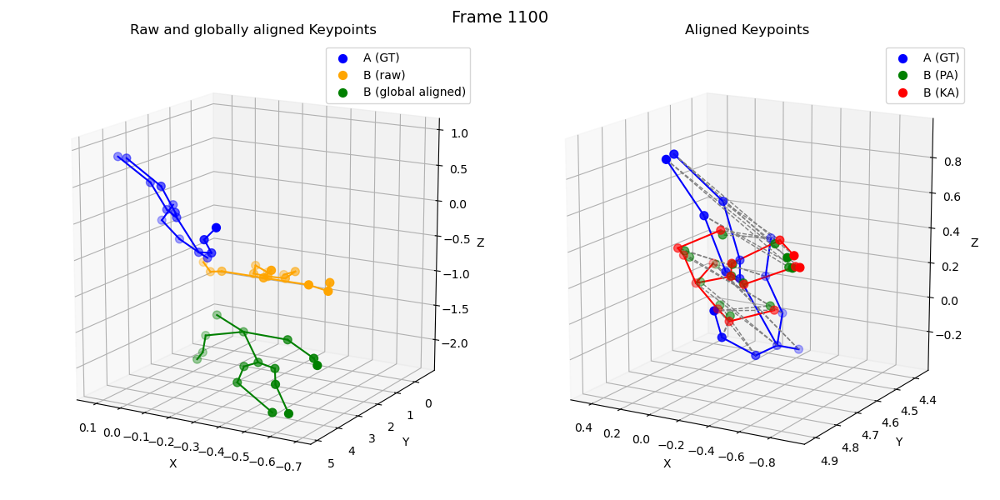

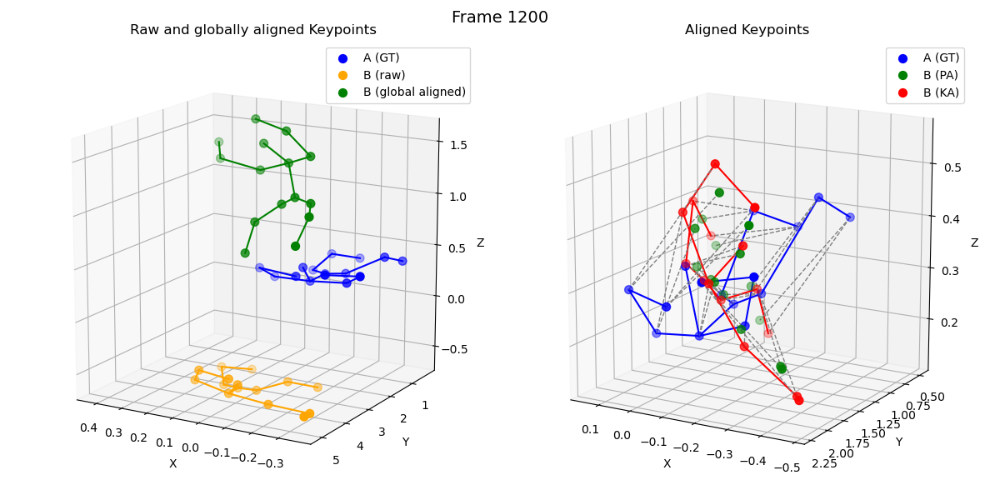

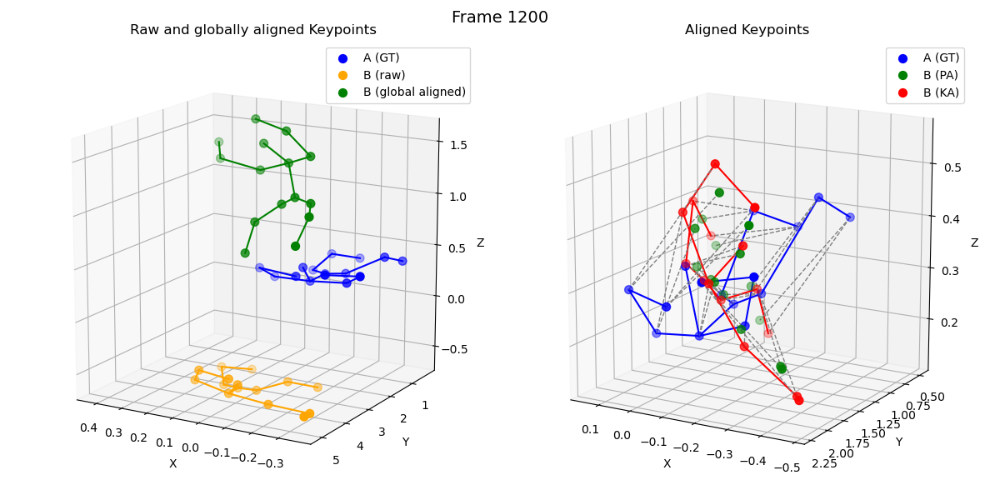

In [50]:
def plot_keypoints_raw_vs_aligned(A_frame, B_raw, B_global, B_PA, B_KA, title="", pause=0.5):
    """
    A_frame:      (13, 3) - Ground truth
    B_raw:        (13, 3) - Before alignment
    B_aligned:    (13, 3) - After alignment (e.g., Procrustes)
    """
    fig = plt.figure(figsize=(12, 6))

    # Raw version
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(*A_frame.T, c='blue', label='A (GT)', s=50)
    ax1.scatter(*B_raw.T, c='orange', label='B (raw)', s=50)
    ax1.scatter(*B_global.T, c='green', label='B (global aligned)', s=50)

    draw_skeleton(A_frame, 'blue', ax1)
    draw_skeleton(B_raw, 'orange', ax1)
    draw_skeleton(B_global, 'green', ax1)

    ax1.set_title("Raw and globally aligned Keypoints")
    ax1.legend()
    ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z')
    ax1.set_box_aspect([1,1,1])
    ax1.view_init(elev=15, azim=120)

    # Procrustes Aligned version
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(*A_frame.T, c='blue', label='A (GT)', s=50)
    ax2.scatter(*B_PA.T, c='green', label='B (PA)', s=50)
    ax2.scatter(*B_KA.T, c='red', label='B (KA)', s=50)

    draw_skeleton(A_frame, 'blue', ax2)
    draw_skeleton(B_KA, 'red', ax2)
    
    for i in range(A_frame.shape[0]):
        ax2.plot([A_frame[i, 0], B_PA[i, 0]],
                 [A_frame[i, 1], B_PA[i, 1]],
                 [A_frame[i, 2], B_PA[i, 2]],
                 c='gray', linestyle='--', linewidth=1)
    
    for i in range(A_frame.shape[0]):
        ax2.plot([A_frame[i, 0], B_KA[i, 0]],
                 [A_frame[i, 1], B_KA[i, 1]],
                 [A_frame[i, 2], B_KA[i, 2]],
                 c='gray', linestyle='--', linewidth=1)

    ax2.set_title("Aligned Keypoints")
    ax2.legend()
    ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z')
    ax2.set_box_aspect([1,1,1])
    ax2.view_init(elev=15, azim=120)

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show(block=False)
    plt.pause(pause)
    plt.close()

for t in range(0, F, 100):  # Every 100 frames
    plot_keypoints_raw_vs_aligned(
        A_frame=A[t],
        B_raw=B_selected_all[t],
        B_global=B_selected_global_all[t],
        B_PA=B_selected_PA_all[t],
        B_KA=B_selected_KA_all[t],
        title=f"Frame {t}",
        pause=0.5
    )

### Show unique frame

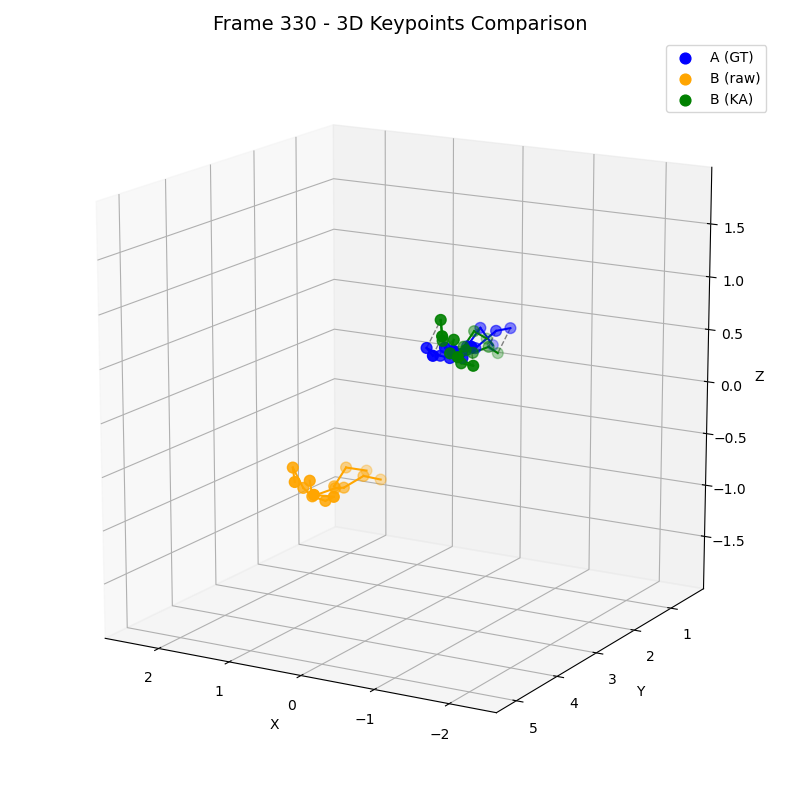

In [51]:
%matplotlib widget
def plot_3sets_single_frame(A_frame, B_raw, B_aligned, title=""):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(*A_frame.T, c='blue', label='A (GT)', s=60)
    ax.scatter(*B_raw.T, c='orange', label='B (raw)', s=60)
    ax.scatter(*B_aligned.T, c='green', label='B (KA)', s=60)

    # Draw lines between A and aligned B keypoints
    for i in range(A_frame.shape[0]):
        ax.plot([A_frame[i, 0], B_aligned[i, 0]],
                [A_frame[i, 1], B_aligned[i, 1]],
                [A_frame[i, 2], B_aligned[i, 2]],
                c='gray', linestyle='--', linewidth=1)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax.legend()
    ax.view_init(elev=15, azim=120)
    ax.axis('equal')
    ax.set_box_aspect([1,1,1])  # Equal aspect ratio

    draw_skeleton(A_frame, 'blue', ax)
    draw_skeleton(B_raw, 'orange', ax)
    draw_skeleton(B_aligned, 'green', ax)

    plt.tight_layout()
    plt.show()

frame_idx = 330 # choose any frame you want to visualize

plot_3sets_single_frame(
    A_frame=A_valid[frame_idx],
    B_raw=B_selected_all[frame_idx],
    B_aligned=B_selected_KA_all[frame_idx],
    title=f"Frame {frame_idx} - 3D Keypoints Comparison"
)

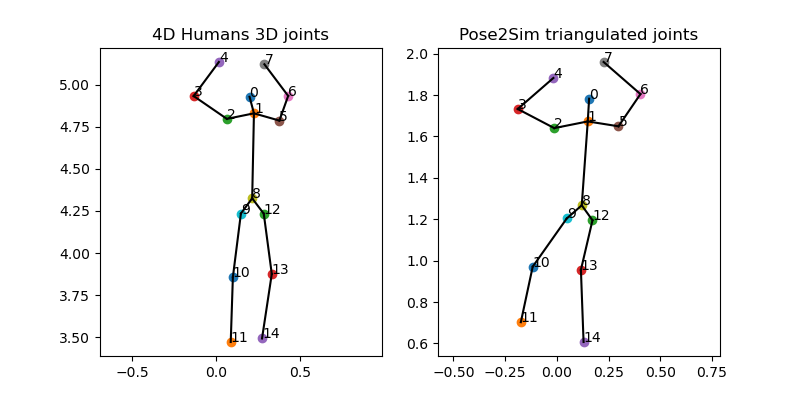

In [52]:
plt.close()
frame_idx = 330

fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(121)

B_athlete = B_selected_all[frame_idx]

for i, pt in enumerate(B_athlete):
    ax.scatter(pt[0], pt[1])
    ax.text(pt[0], pt[1], i)

draw_skeleton(B_athlete[:, :2], 'black', ax)
ax.axis('equal')
ax.set_title('4D Humans 3D joints')

ax = fig.add_subplot(122)
for i, pt in enumerate(A_valid[frame_idx]):
    ax.scatter(pt[0], pt[1])
    ax.text(pt[0], pt[1], i)

draw_skeleton(A_valid[frame_idx, :, :2], 'black', ax)
ax.axis('equal')
ax.set_title('Pose2Sim triangulated joints')

plt.show()


## Stats on all registrations

Raw
Average MPJPE: 3.546 m
Median MPJPE: 3.502 m
Min MPJPE: 0.227 m
Max MPJPE: 15.022 m
Global
Average MPJPE: 1.895 m
Median MPJPE: 1.727 m
Min MPJPE: 0.180 m
Max MPJPE: 13.926 m
PA
Average MPJPE: 0.231 m
Median MPJPE: 0.158 m
Min MPJPE: 0.018 m
Max MPJPE: 0.822 m
KA
Average MPJPE: 0.259 m
Median MPJPE: 0.184 m
Min MPJPE: 0.035 m
Max MPJPE: 0.923 m


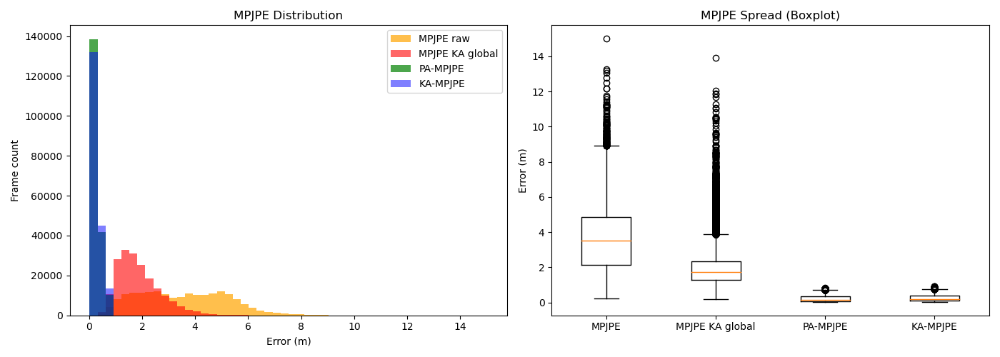

In [53]:
import json

with open("/home/lea/trampo/mpjpe_raw_dict.json", "r") as file:
    mpjpe_raw_dict = json.load(file)

with open("/home/lea/trampo/mpjpe_global_dict.json", "r") as file:
    mpjpe_global_dict = json.load(file)

with open("/home/lea/trampo/mpjpe_pa_dict.json", "r") as file:
    mpjpe_pa_dict = json.load(file)

with open("/home/lea/trampo/mpjpe_ka_dict.json", "r") as file:
    mpjpe_ka_dict = json.load(file)


all_values = {}
for metric, name in zip([mpjpe_raw_dict, mpjpe_global_dict, mpjpe_pa_dict, mpjpe_ka_dict],
                        ['Raw', 'Global', 'PA', 'KA']):
    
    all_values.update({name: []})
    for routine, dicts in metric.items():
        for cam, vals in dicts.items():
            if len(vals) > 0:
                all_values[name].append(vals)

    all_values[name] = np.concatenate(all_values[name], axis=-1).reshape((-1,))
    print(name)

    print(f'Average MPJPE: {np.mean(all_values[name]):.3f} m')
    print(f'Median MPJPE: {np.median(all_values[name]):.3f} m')
    print(f'Min MPJPE: {np.min(all_values[name]):.3f} m')
    print(f'Max MPJPE: {np.max(all_values[name]):.3f} m')

frames = np.arange(len(all_values['Raw']))

plt.figure(figsize=(14, 5))

# --- MPJPE raw histogram ---
all_data = np.concatenate([
    all_values['Raw'],
    all_values['Global'],
    all_values['PA'],
    all_values['KA']
])
bin_edges = np.histogram_bin_edges(all_data, bins=50)

# Plot histograms with shared bin edges
plt.subplot(1, 2, 1)
plt.hist(all_values['Raw'], bins=bin_edges, alpha=0.7, label='MPJPE raw', color='orange')
plt.hist(all_values['Global'], bins=bin_edges, alpha=0.6, label='MPJPE KA global', color='red')
plt.hist(all_values['PA'], bins=bin_edges, alpha=0.7, label='PA-MPJPE', color='green')
plt.hist(all_values['KA'], bins=bin_edges, alpha=0.5, label='KA-MPJPE', color='blue')
plt.xlabel('Error (m)')
plt.ylabel('Frame count')
plt.title('MPJPE Distribution')
plt.legend()

# --- Boxplot ---
plt.subplot(1, 2, 2)
plt.boxplot([all_values['Raw'], all_values['Global'], all_values['PA'], all_values['KA']], labels=['MPJPE', 'MPJPE KA global', 'PA-MPJPE', 'KA-MPJPE'])
plt.ylabel('Error (m)')
plt.title('MPJPE Spread (Boxplot)')

plt.tight_layout()
plt.savefig('MPJPE_all.png')
plt.show()


## Stats and graphs of MPJPE per camera

Raw
Average MPJPE: 2.997 m
Median MPJPE: 2.806 m
Min MPJPE: 0.227 m
Max MPJPE: 12.171 m
Global
Average MPJPE: 1.734 m
Median MPJPE: 1.620 m
Min MPJPE: 0.245 m
Max MPJPE: 8.487 m
PA
Average MPJPE: 0.221 m
Median MPJPE: 0.144 m
Min MPJPE: 0.018 m
Max MPJPE: 0.801 m
KA
Average MPJPE: 0.250 m
Median MPJPE: 0.172 m
Min MPJPE: 0.037 m
Max MPJPE: 0.837 m


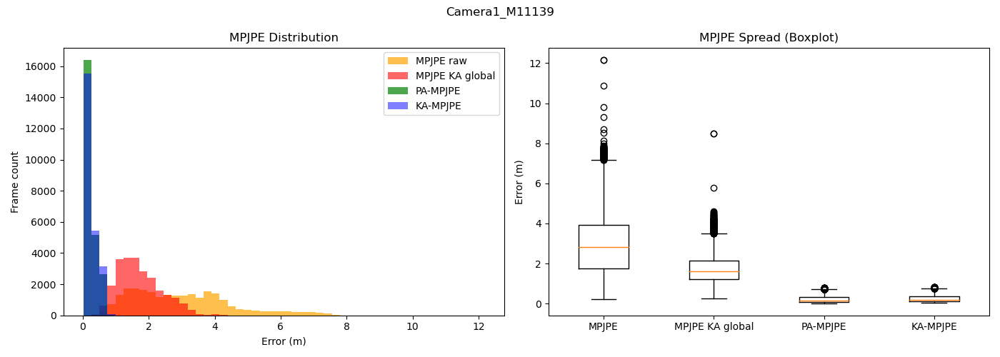

Raw
Average MPJPE: 3.212 m
Median MPJPE: 2.821 m
Min MPJPE: 0.232 m
Max MPJPE: 7.014 m
Global
Average MPJPE: 1.905 m
Median MPJPE: 1.708 m
Min MPJPE: 0.351 m
Max MPJPE: 7.742 m
PA
Average MPJPE: 0.229 m
Median MPJPE: 0.154 m
Min MPJPE: 0.022 m
Max MPJPE: 0.800 m
KA
Average MPJPE: 0.255 m
Median MPJPE: 0.179 m
Min MPJPE: 0.035 m
Max MPJPE: 0.846 m


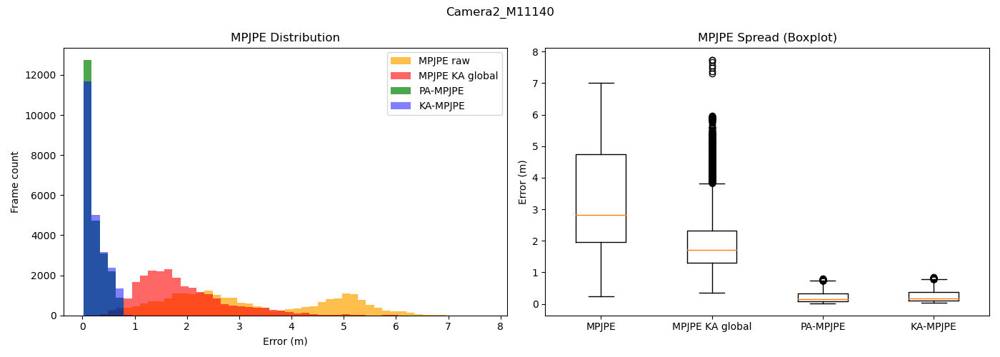

Raw
Average MPJPE: 3.608 m
Median MPJPE: 3.977 m
Min MPJPE: 0.318 m
Max MPJPE: 10.539 m
Global
Average MPJPE: 1.659 m
Median MPJPE: 1.486 m
Min MPJPE: 0.280 m
Max MPJPE: 12.034 m
PA
Average MPJPE: 0.229 m
Median MPJPE: 0.149 m
Min MPJPE: 0.021 m
Max MPJPE: 0.805 m
KA
Average MPJPE: 0.254 m
Median MPJPE: 0.173 m
Min MPJPE: 0.037 m
Max MPJPE: 0.838 m


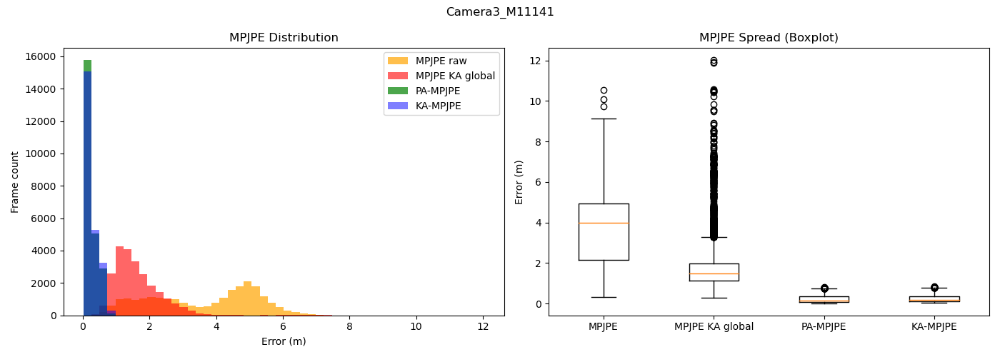

Raw
Average MPJPE: 3.749 m
Median MPJPE: 3.328 m
Min MPJPE: 0.410 m
Max MPJPE: 10.386 m
Global
Average MPJPE: 2.483 m
Median MPJPE: 2.391 m
Min MPJPE: 0.264 m
Max MPJPE: 7.149 m
PA
Average MPJPE: 0.229 m
Median MPJPE: 0.156 m
Min MPJPE: 0.023 m
Max MPJPE: 0.793 m
KA
Average MPJPE: 0.254 m
Median MPJPE: 0.178 m
Min MPJPE: 0.036 m
Max MPJPE: 0.829 m


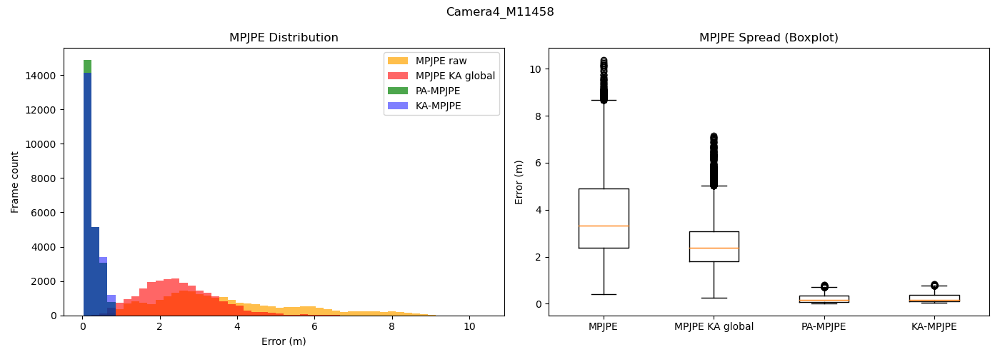

Raw
Average MPJPE: 3.445 m
Median MPJPE: 3.322 m
Min MPJPE: 0.250 m
Max MPJPE: 13.260 m
Global
Average MPJPE: 1.935 m
Median MPJPE: 1.771 m
Min MPJPE: 0.280 m
Max MPJPE: 11.072 m
PA
Average MPJPE: 0.234 m
Median MPJPE: 0.165 m
Min MPJPE: 0.027 m
Max MPJPE: 0.814 m
KA
Average MPJPE: 0.268 m
Median MPJPE: 0.195 m
Min MPJPE: 0.042 m
Max MPJPE: 0.923 m


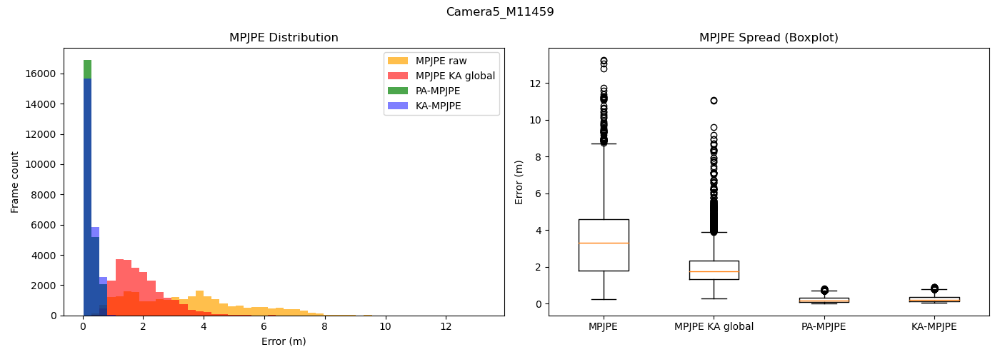

Raw
Average MPJPE: 4.223 m
Median MPJPE: 4.511 m
Min MPJPE: 0.650 m
Max MPJPE: 15.022 m
Global
Average MPJPE: 2.118 m
Median MPJPE: 1.978 m
Min MPJPE: 0.321 m
Max MPJPE: 13.926 m
PA
Average MPJPE: 0.247 m
Median MPJPE: 0.190 m
Min MPJPE: 0.023 m
Max MPJPE: 0.822 m
KA
Average MPJPE: 0.268 m
Median MPJPE: 0.208 m
Min MPJPE: 0.039 m
Max MPJPE: 0.876 m


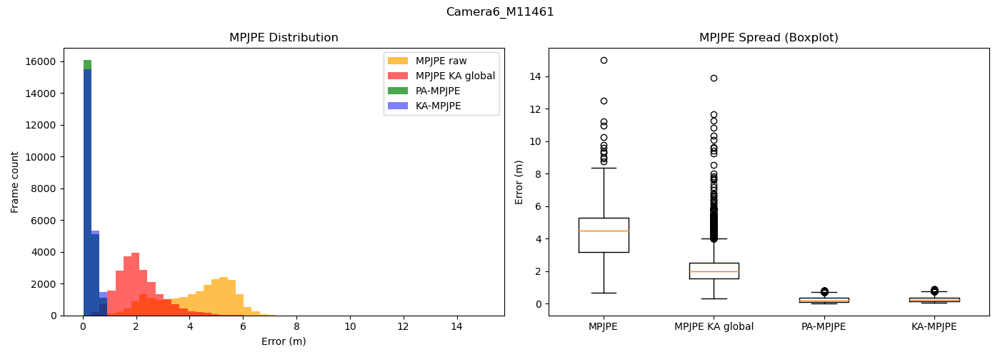

Raw
Average MPJPE: 3.435 m
Median MPJPE: 3.582 m
Min MPJPE: 0.230 m
Max MPJPE: 11.694 m
Global
Average MPJPE: 1.692 m
Median MPJPE: 1.597 m
Min MPJPE: 0.180 m
Max MPJPE: 6.737 m
PA
Average MPJPE: 0.225 m
Median MPJPE: 0.148 m
Min MPJPE: 0.022 m
Max MPJPE: 0.808 m
KA
Average MPJPE: 0.255 m
Median MPJPE: 0.178 m
Min MPJPE: 0.040 m
Max MPJPE: 0.835 m


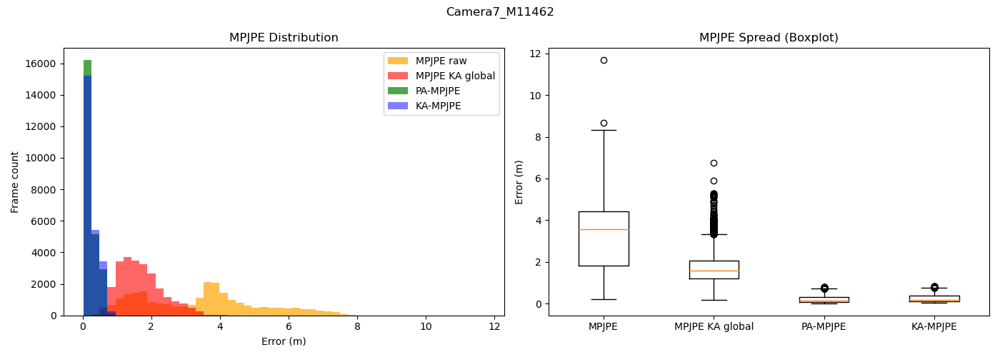

Raw
Average MPJPE: 3.748 m
Median MPJPE: 4.200 m
Min MPJPE: 0.274 m
Max MPJPE: 8.097 m
Global
Average MPJPE: 1.662 m
Median MPJPE: 1.498 m
Min MPJPE: 0.401 m
Max MPJPE: 7.301 m
PA
Average MPJPE: 0.234 m
Median MPJPE: 0.156 m
Min MPJPE: 0.021 m
Max MPJPE: 0.794 m
KA
Average MPJPE: 0.266 m
Median MPJPE: 0.185 m
Min MPJPE: 0.038 m
Max MPJPE: 0.837 m


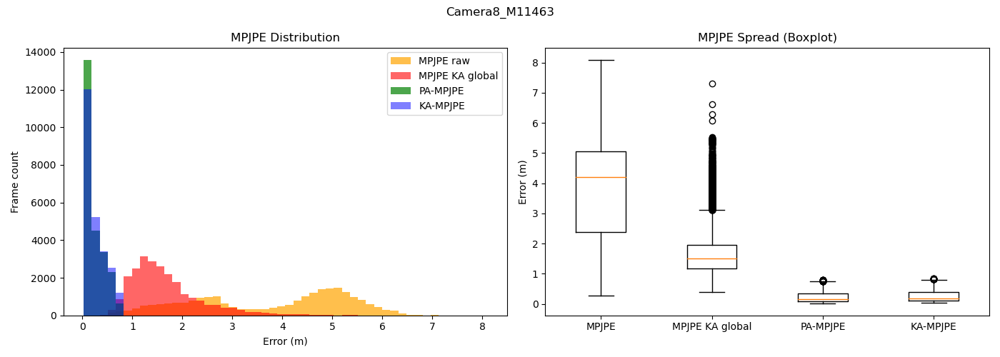

In [54]:
routines = list(mpjpe_raw_dict.keys())

for cam in mpjpe_raw_dict[routines[0]]:
    all_values = {}
    for metric, name in zip([mpjpe_raw_dict, mpjpe_global_dict, mpjpe_pa_dict, mpjpe_ka_dict],
                            ['Raw', 'Global', 'PA', 'KA']):
        
        all_values.update({name: []})
        for routine, dicts in metric.items():
            vals = dicts[cam]
            if len(vals) > 0:
                all_values[name].append(vals)

        all_values[name] = np.concatenate(all_values[name], axis=-1).reshape((-1,))
        print(name)

        print(f'Average MPJPE: {np.mean(all_values[name]):.3f} m')
        print(f'Median MPJPE: {np.median(all_values[name]):.3f} m')
        print(f'Min MPJPE: {np.min(all_values[name]):.3f} m')
        print(f'Max MPJPE: {np.max(all_values[name]):.3f} m')
    
    frames = np.arange(len(all_values['Raw']))

    plt.figure(figsize=(14, 5))

    # --- MPJPE raw histogram ---
    all_data = np.concatenate([
        all_values['Raw'],
        all_values['Global'],
        all_values['PA'],
        all_values['KA']
    ])
    bin_edges = np.histogram_bin_edges(all_data, bins=50)

    # Plot histograms with shared bin edges
    plt.subplot(1, 2, 1)
    plt.hist(all_values['Raw'], bins=bin_edges, alpha=0.7, label='MPJPE raw', color='orange')
    plt.hist(all_values['Global'], bins=bin_edges, alpha=0.6, label='MPJPE KA global', color='red')
    plt.hist(all_values['PA'], bins=bin_edges, alpha=0.7, label='PA-MPJPE', color='green')
    plt.hist(all_values['KA'], bins=bin_edges, alpha=0.5, label='KA-MPJPE', color='blue')
    plt.xlabel('Error (m)')
    plt.ylabel('Frame count')
    plt.title('MPJPE Distribution')
    plt.legend()

    # --- Boxplot ---
    plt.subplot(1, 2, 2)
    plt.boxplot([all_values['Raw'], all_values['Global'], all_values['PA'], all_values['KA']], labels=['MPJPE', 'MPJPE KA global', 'PA-MPJPE', 'KA-MPJPE'])
    plt.ylabel('Error (m)')
    plt.title('MPJPE Spread (Boxplot)')

    plt.suptitle(cam)
    plt.tight_layout()
    plt.savefig(f'MPJPE_{cam}.png')
    plt.show()